# AOD EDA: MODIS 0.55 µm vs Himawari (0.50 µm original & 0.55 µm AE-corrected)

Exploratory Data Analysis comparing Aerosol Optical Depth (AOD) measurements from:
- **MODIS MCD19A2** — `Optical_Depth_055` only (0.55 µm)
- **Himawari L3 Envisoft** — two variants:
  - `AOD_Himawari` : original `AOT_Merged_center` at 0.50 µm
  - `AOD_Himawari_055` : wavelength-corrected to 0.55 µm using the Ångström exponent (`AE_Merged`) when available; falls back to the original 0.50 µm value when `AE_Merged` is NaN

**Conversion formula** (when AE is available):
$$\tau_{0.55} = \tau_{0.50} \times \left(\frac{0.55}{0.50}\right)^{-\alpha}$$

Goals:
1. Load and clean both datasets per station
2. Merge on overlapping timestamps; compute `AOD_Himawari_055`
3. Correlation analysis — MODIS 0.55 µm vs Himawari 0.50 µm (original) **and** vs Himawari 0.55 µm (AE-corrected)
4. Time-series comparison per station
5. Aggregate statistics across all stations

## 0 · Imports & Configuration

In [1]:
import os
import re
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats
from sklearn.metrics import mean_squared_error, mean_absolute_error

warnings.filterwarnings('ignore')
# 1. ACADEMIC STYLE SETUP
# Use 'ticks' for a clean, classic academic background
sns.set_theme(style='ticks', font_scale=1.1)

# Update rcParams for publication standards
plt.rcParams.update({
    'figure.dpi': 300,              # 300 DPI is the print standard
    'figure.facecolor': 'white',
    'font.family': 'serif',         # Matches manuscript text
    'pdf.fonttype': 42,             # Embeds fonts for PDF export
    'ps.fonttype': 42,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'axes.titlesize': 14
})

# ── Paths ──────────────────────────────────────────────────────────────────
MODIS_DIR = Path('/home/slow_data/Air_Quality/MODIS_MCD19A2/stations_aod_v3')
HIMA_DIR  = Path('/home/slow_data/Air_Quality/Himawari/station_aod_v3/L3')
MASTERDATA    = Path('/home/work1/projects/Air_Quality/Masterdata/envisoft_27_stations.csv')


# ── Only MODIS 0.55 µm band
MODIS_BAND     = 'Optical_Depth_055'
MODIS_COL      = 'AOD_MODIS_055'

# ── Himawari column labels used throughout
HIMA_050_COL   = 'AOD_Himawari'      # original 0.50 µm
HIMA_055_COL   = 'AOD_Himawari_055'  # AE-corrected to 0.55 µm (or 0.50 fallback)

# Convenience list for loops: (col, short label, colour)
HIMA_VARIANTS = [
    (HIMA_050_COL, 'Himawari 0.50 µm (original)',      '#2D7DBB'),
    (HIMA_055_COL, 'Himawari 0.55 µm (AE-corrected)', '#1B4F8A'),
]

# ── Station masterdata: stationName (= CSV filename stem) → (lat, lon) ──────
_meta = pd.read_csv(MASTERDATA)

print(f'Masterdata loaded    : {len(_meta)} stations')

print('MODIS dir exists :', MODIS_DIR.exists())
print('Himawari dir exists:', HIMA_DIR.exists())

Masterdata loaded    : 27 stations
MODIS dir exists : True
Himawari dir exists: True


## 1 · Discover Station Files

In [2]:
modis_files: dict[str, list[Path]] = {}
for f in MODIS_DIR.glob('*.csv'):
    sid = f.stem
    modis_files.setdefault(sid, []).append(f)

hima_files: dict[str, list[Path]] = {}
for f in HIMA_DIR.glob('*.csv'):
    sid = f.stem
    hima_files.setdefault(sid, []).append(f)

master_stations = set(_meta['stationName'].tolist())
common_ids = sorted(set(modis_files) & set(hima_files) & master_stations)

print(f'MODIS stations   : {len(modis_files)}')
print(f'Himawari stations: {len(hima_files)}')
print(f'Masterdata stations: {len(master_stations)}')
print(f'Common stations  : {len(common_ids)}')
print('\nFirst 10 common IDs:')
for sid in common_ids[:10]:
    print(' ', sid)

MODIS stations   : 123
Himawari stations: 123
Masterdata stations: 27
Common stations  : 27

First 10 common IDs:
  Bình Dương: số 593 Đại lộ Bình Dương, P. Hiệp Thành (KK)
  Bình Định: Khuôn viên Cây xanh gần cầu chui đường Hoa Lư - TP. Quy Nhơn (KK)
  Gia Lai: KCN Trà Đa - Tp Pleiku (KK)
  Gia Lai: UBND thị xã An Khê (KK)
  HCM: Khu Liên cơ quan Bộ Tài Nguyên và Môi Trường - số 20 Đ. Lý Chính Thắng (KK)
  HCM: Đ. Lê Hữu Kiều - P. Bình Trưng Tây - Quận 2 (Ngã ba Lê Hữu Kiểu và Trương Văn Bang) (KK)
  Hà Nam: Công Viên Nam Cao - P.Quang Trung - TP. Phủ Lý (KK)
  Hà Nội: 556 Nguyễn Văn Cừ (KK)
  Hà Nội: Công viên Nhân Chính - Khuất Duy Tiến (KK)
  Hà Nội: ĐHBK cổng Parabol đường Giải Phóng (KK)


## 2 · Loader Functions

In [3]:
def load_modis(paths: list[Path]) -> pd.DataFrame:
    """
    Load and concatenate MODIS station CSVs for one station.
    Returns only the 0.55 µm band (Optical_Depth_055).
    """
    frames = [pd.read_csv(p, parse_dates=['timestamp'], low_memory=False) for p in paths]
    df = pd.concat(frames, ignore_index=True)
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df = df.dropna(subset=['timestamp'])
    df = df.sort_values('timestamp').set_index('timestamp')

    if 'stationName' in df.columns and 'Name' not in df.columns:
        df = df.rename(columns={'stationName': 'Name'})

    out = df[[c for c in ['Name', 'Latitude', 'Longitude'] if c in df.columns]].copy()
    out[MODIS_COL] = df[MODIS_BAND].copy().astype(float)
    return out


def load_himawari(paths: list[Path]) -> pd.DataFrame:
    """
    Load and concatenate Himawari L3 station CSVs for one station.
    Returns:
      - AOD_Himawari  : AOT_Merged_center at 0.50 µm
      - AE_Himawari   : Ångström exponent from AE_Merged (if present)
      - QA_Himawari   : QA flag (if present)
    """
    frames = [pd.read_csv(p, parse_dates=['timestamp'], low_memory=False) for p in paths]
    df = pd.concat(frames, ignore_index=True)
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df = df.dropna(subset=['timestamp'])
    df = df.sort_values('timestamp').set_index('timestamp')

    out = pd.DataFrame({HIMA_050_COL: df['AOT_Merged_center'].astype(float)})

    if 'AE_Merged' in df.columns:
        out['AE_Himawari'] = df['AE_Merged'].astype(float)
    if 'QA_flag_Merged' in df.columns:
        out['QA_Himawari'] = df['QA_flag_Merged']

    return out


print('Loader functions defined ✓')

Loader functions defined ✓


## 3 · Build Merged Dataset (all stations)

For each MODIS overpass we average all Himawari observations within a **±1 h window**.  
We also average `AE_Himawari` over that window and use it to compute `AOD_Himawari_055`:

- **AE available** → `AOD_Himawari_055 = AOD_Himawari × (0.55 / 0.50)^(−AE)`  
- **AE = NaN** → `AOD_Himawari_055 = AOD_Himawari` (keep original 0.50 µm value)

In [4]:
records = []
station_dfs = {}   # per-station merged DF for later cells

_radius = pd.Timedelta('1h')
WL_RATIO = 0.55 / 0.50   # wavelength ratio for Ångström conversion

for sid in common_ids:
    try:
        modis = load_modis(modis_files[sid])
        hima  = load_himawari(hima_files[sid])

        hima_aod = hima[HIMA_050_COL]
        has_ae   = 'AE_Himawari' in hima.columns
        has_qa   = 'QA_Himawari' in hima.columns

        aod_means, ae_means, qa_modes = [], [], []

        for ts in modis.index:
            t0, t1 = ts - _radius, ts + _radius
            window_aod = hima_aod.loc[t0:t1]

            aod_means.append(window_aod.mean() if len(window_aod) > 0 else float('nan'))

            if has_ae:
                window_ae = hima['AE_Himawari'].loc[t0:t1]
                ae_means.append(window_ae.mean() if len(window_ae) > 0 else float('nan'))

            if has_qa:
                window_qa = hima['QA_Himawari'].loc[t0:t1]
                mode_val  = window_qa.mode()
                qa_modes.append(mode_val.iloc[0] if len(mode_val) > 0 else float('nan'))

        merged = modis.copy()
        merged[HIMA_050_COL] = aod_means

        if has_ae:
            merged['AE_Himawari'] = ae_means
        else:
            merged['AE_Himawari'] = float('nan')

        if has_qa:
            merged['QA_Himawari'] = qa_modes

        # ── Wavelength correction ──────────────────────────────────────────
        # When AE is available: τ(0.55) = τ(0.50) × (0.55/0.50)^(-AE)
        # When AE is NaN      : keep original τ(0.50)
        ae_col = merged['AE_Himawari']
        merged[HIMA_055_COL] = np.where(
            ae_col.notna(),
            merged[HIMA_050_COL] * WL_RATIO ** (-ae_col),
            merged[HIMA_050_COL]
        )

        # Drop rows where no Himawari data fell in the ±1 h window
        merged = merged.dropna(subset=[HIMA_050_COL])
        if len(merged) == 0:
            continue

        for col in ['Name', 'Latitude', 'Longitude']:
            if col in modis.columns:
                merged[col] = modis[col].iloc[0] if not modis[col].empty else float('nan')
        merged['station_id'] = sid

        station_dfs[sid] = merged
        records.append(merged.reset_index())

    except Exception as e:
        print(f'[WARN] {sid}: {e}')

all_df = pd.concat(records, ignore_index=True) if records else pd.DataFrame()
all_df['timestamp'] = pd.to_datetime(all_df['timestamp'], utc=True)

# Coverage stats for the AE-corrected column
n_ae_converted = all_df['AE_Himawari'].notna().sum()
n_fallback      = all_df['AE_Himawari'].isna().sum()

print(f'Total matched records       : {len(all_df):,}')
print(f'Stations with data          : {all_df["station_id"].nunique()}')
print(f'Date range                  : {all_df["timestamp"].min().date()} → {all_df["timestamp"].max().date()}')
print(f'AOD_Himawari_055 (AE-conv.) : {n_ae_converted:,} rows  '
      f'({100*n_ae_converted/max(len(all_df),1):.1f}%)')
print(f'AOD_Himawari_055 (fallback) : {n_fallback:,} rows  '
      f'({100*n_fallback/max(len(all_df),1):.1f}%)')
all_df[[MODIS_COL, HIMA_050_COL, HIMA_055_COL, 'AE_Himawari']].head()

Total matched records       : 3,047
Stations with data          : 27
Date range                  : 2022-09-03 → 2026-03-08
AOD_Himawari_055 (AE-conv.) : 448 rows  (14.7%)
AOD_Himawari_055 (fallback) : 2,599 rows  (85.3%)


,AOD_MODIS_055,AOD_Himawari,AOD_Himawari_055,AE_Himawari
0,0.129,0.3248,0.3248,NaN
1,0.382,0.4124,0.4124,NaN
2,0.075,0.2487,0.2487,NaN
3,0.263,0.2176,0.2176,NaN
4,0.244,0.2995,0.2995,NaN


## 4 · Data Overview & Missing-Value Summary

=== Basic statistics ===


,count,mean,std,min,25%,50%,75%,max
AOD_MODIS_055,3047.0,0.3796,0.2494,0.0000,0.2080,0.3220,0.4840,1.8930
AOD_Himawari,3047.0,0.3827,0.2914,0.0098,0.1761,0.2997,0.5129,2.0585
AOD_Himawari_055,3047.0,0.3829,0.2908,0.0098,0.1769,0.3013,0.5130,2.0585
AE_Himawari,448.0,-0.0811,0.2985,-0.4986,-0.3238,-0.1563,0.1140,0.9892



Median pairs per station : 112
Stations with ≥30 pairs  : 24


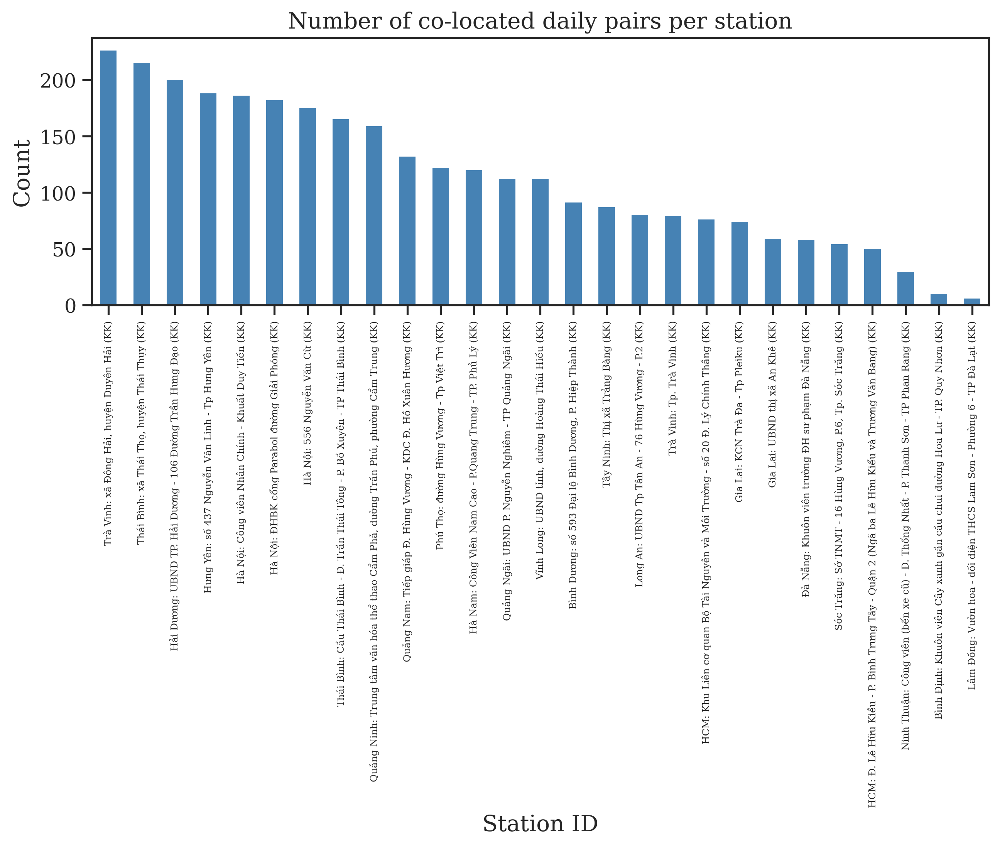

In [5]:
print('=== Basic statistics ===')
display(
    all_df[[MODIS_COL, HIMA_050_COL, HIMA_055_COL, 'AE_Himawari']]
    .describe().T.round(4)
)

pair_counts = all_df.groupby('station_id').size().rename('n_pairs').sort_values(ascending=False)
print(f'\nMedian pairs per station : {pair_counts.median():.0f}')
print(f'Stations with ≥30 pairs  : {(pair_counts >= 30).sum()}')

fig, ax = plt.subplots(figsize=(10, 3))
pair_counts.plot(kind='bar', ax=ax, color='steelblue', edgecolor='none')
ax.set_title('Number of co-located daily pairs per station')
ax.set_xlabel('Station ID'); ax.set_ylabel('Count')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=6)
plt.tight_layout(); plt.show()

## 5 · AOD Value Distributions

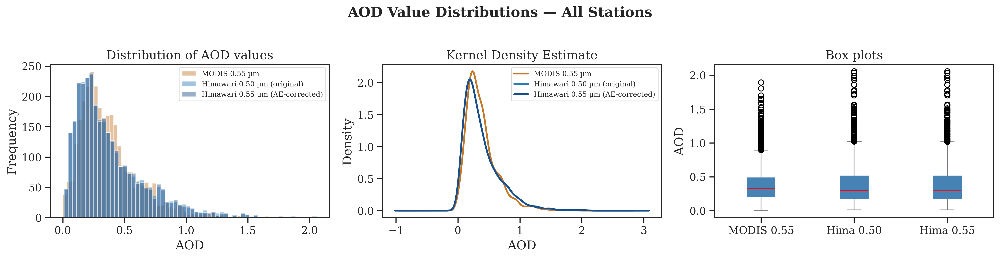

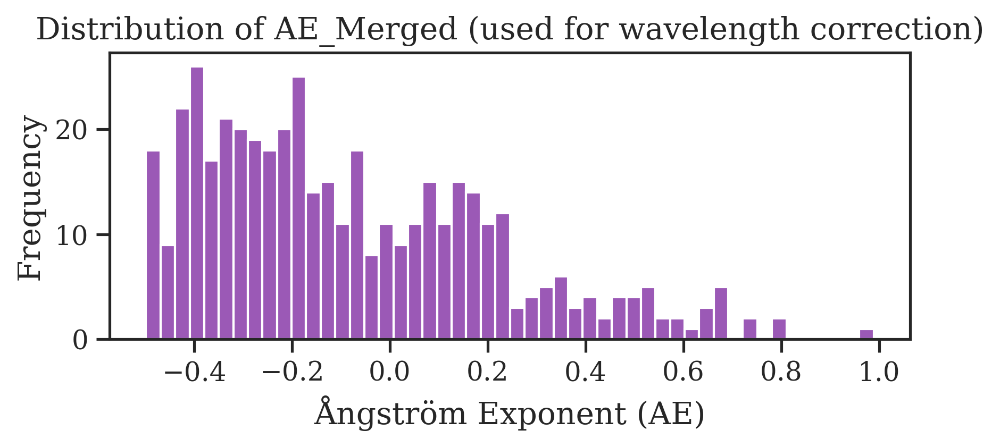

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

series_cfg = [
    (MODIS_COL,    '#C4782A', 'MODIS 0.55 µm'),
    (HIMA_050_COL, '#2D7DBB', 'Himawari 0.50 µm (original)'),
    (HIMA_055_COL, '#1B4F8A', 'Himawari 0.55 µm (AE-corrected)'),
]

# Histogram
for col, color, label in series_cfg:
    all_df[col].plot.hist(bins=60, alpha=0.45, color=color, label=label, ax=axes[0])
axes[0].set_xlabel('AOD'); axes[0].set_title('Distribution of AOD values')
axes[0].legend(fontsize=8)

# KDE
for col, color, label in series_cfg:
    all_df[col].dropna().plot.kde(ax=axes[1], color=color, lw=2, label=label)
axes[1].set_xlabel('AOD'); axes[1].set_title('Kernel Density Estimate')
axes[1].legend(fontsize=8)

# Box plots
all_df[[c for c, _, _ in series_cfg]].rename(columns={
    MODIS_COL:    'MODIS 0.55',
    HIMA_050_COL: 'Hima 0.50',
    HIMA_055_COL: 'Hima 0.55'
}).plot.box(
    ax=axes[2],
    color={'boxes': 'steelblue', 'medians': 'red', 'whiskers': 'gray', 'caps': 'gray'},
    patch_artist=True
)
axes[2].set_title('Box plots'); axes[2].set_ylabel('AOD')

plt.suptitle('AOD Value Distributions — All Stations', fontweight='bold', y=1.02)
plt.tight_layout(); plt.show()

# AE distribution
fig, ax = plt.subplots(figsize=(6, 3))
all_df['AE_Himawari'].dropna().plot.hist(bins=50, color='#9B59B6', edgecolor='white', ax=ax)
ax.set_xlabel('Ångström Exponent (AE)')
ax.set_title('Distribution of AE_Merged (used for wavelength correction)')
plt.tight_layout(); plt.show()

## 6 · Global Correlation Analysis

Side-by-side: **MODIS 0.55 µm vs Himawari 0.50 µm (original)** and **vs Himawari 0.55 µm (AE-corrected)**.

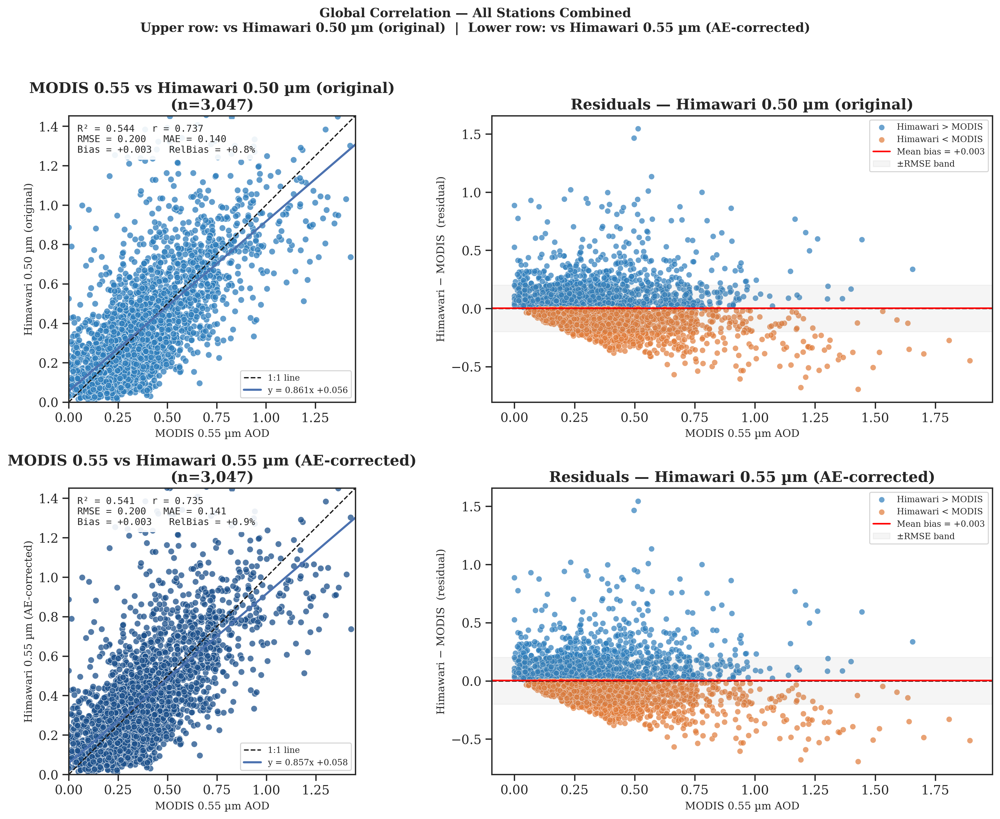

,n,r,R2,slope,intercept,RMSE,MAE,Bias,RelBias_pct
AOD_Himawari,3047.0,0.7374,0.5437,0.8614,0.0557,0.1998,0.1401,0.0031,0.8159
AOD_Himawari_055,3047.0,0.7353,0.5407,0.8572,0.0576,0.2002,0.1405,0.0033,0.8793


In [7]:
def regression_stats(x: pd.Series, y: pd.Series) -> dict:
    """Compute key regression / agreement statistics (x = reference, y = estimate)."""
    mask = x.notna() & y.notna()
    x, y = x[mask].values, y[mask].values
    if len(x) < 3:
        return dict(n=len(x), r=np.nan, R2=np.nan, slope=np.nan,
                    intercept=np.nan, RMSE=np.nan, MAE=np.nan,
                    Bias=np.nan, RelBias_pct=np.nan)
    slope, intercept, r, p, _ = stats.linregress(x, y)
    rmse    = np.sqrt(mean_squared_error(x, y))
    mae     = mean_absolute_error(x, y)
    bias    = np.mean(y - x)          # Himawari − MODIS
    relbias = bias / np.mean(x) * 100
    return dict(n=len(x), r=r, R2=r**2, slope=slope, intercept=intercept,
                RMSE=rmse, MAE=mae, Bias=bias, RelBias_pct=relbias)


# ── 2 × 2 grid: [scatter | residuals] for each Himawari variant ───────────
fig, axes = plt.subplots(2, 2, figsize=(14, 11))

gs_dict = {}

for i, (hima_col, hima_label, color) in enumerate(HIMA_VARIANTS):
    gs = regression_stats(all_df[MODIS_COL], all_df[hima_col])
    gs_dict[hima_col] = gs

    # ── Scatter ─────────────────────────────────────────────────────────────
    ax = axes[i, 0]
    valid = all_df[[MODIS_COL, hima_col]].dropna()
    ax.scatter(valid[MODIS_COL], valid[hima_col],
               c=color, edgecolors='white', linewidths=0.4, s=35, alpha=0.75)

    q99  = max(valid[MODIS_COL].quantile(0.99), valid[hima_col].quantile(0.99))
    lims = [0, q99 * 1.05]
    xfit = np.linspace(*lims, 200)
    ax.plot(lims, lims, 'k--', lw=1.2, label='1:1 line')
    ax.plot(xfit, gs['slope']*xfit + gs['intercept'], 'b-', lw=2,
            label=f"y = {gs['slope']:.3f}x {gs['intercept']:+.3f}")
    ax.set_xlim(lims); ax.set_ylim(lims)
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel('MODIS 0.55 µm AOD', fontsize=10)
    ax.set_ylabel(hima_label, fontsize=10)
    ax.set_title(f'MODIS 0.55 vs {hima_label}\n(n={gs["n"]:,})', fontweight='bold')
    stats_text = (f"R² = {gs['R2']:.3f}   r = {gs['r']:.3f}\n"
                  f"RMSE = {gs['RMSE']:.3f}   MAE = {gs['MAE']:.3f}\n"
                  f"Bias = {gs['Bias']:+.3f}   RelBias = {gs['RelBias_pct']:+.1f}%")
    ax.text(0.03, 0.97, stats_text, transform=ax.transAxes,
            va='top', ha='left', fontsize=9, fontfamily='monospace',
            bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9))
    ax.legend(fontsize=8, loc='lower right')

    # ── Residuals ────────────────────────────────────────────────────────────
    ax2 = axes[i, 1]
    resid = all_df[hima_col] - all_df[MODIS_COL]
    valid_resid = all_df[[MODIS_COL]].dropna().join(resid.rename('resid')).dropna()

    pos = valid_resid['resid'] >= 0
    ax2.scatter(valid_resid.loc[pos, MODIS_COL], valid_resid.loc[pos, 'resid'],
                c='#2D7DBB', s=30, alpha=0.7, edgecolors='white', lw=0.3,
                label='Himawari > MODIS')
    ax2.scatter(valid_resid.loc[~pos, MODIS_COL], valid_resid.loc[~pos, 'resid'],
                c='#E07B39', s=30, alpha=0.7, edgecolors='white', lw=0.3,
                label='Himawari < MODIS')
    ax2.axhline(0,          color='k',   lw=1.2, linestyle='--')
    ax2.axhline(gs['Bias'], color='red', lw=1.5, linestyle='-',
                label=f"Mean bias = {gs['Bias']:+.3f}")
    ax2.axhspan(-gs['RMSE'], gs['RMSE'], color='gray', alpha=0.08, label='±RMSE band')
    ax2.set_xlabel('MODIS 0.55 µm AOD', fontsize=10)
    ax2.set_ylabel('Himawari − MODIS  (residual)', fontsize=10)
    ax2.set_title(f'Residuals — {hima_label}', fontweight='bold')
    ax2.legend(fontsize=8)

plt.suptitle(
    'Global Correlation — All Stations Combined\n'
    'Upper row: vs Himawari 0.50 µm (original)  |  '
    'Lower row: vs Himawari 0.55 µm (AE-corrected)',
    fontweight='bold', fontsize=12
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

pd.DataFrame(gs_dict).T.round(4)

## 7 · Per-Station Correlation Statistics

In [8]:
station_stats = []
for sid, df in station_dfs.items():
    if len(df) < 5:
        continue
    for hima_col, hima_label, _ in HIMA_VARIANTS:
        s = regression_stats(df[MODIS_COL], df[hima_col])
        s['station_id']  = sid
        s['hima_variant'] = hima_label
        if 'Name' in df.columns:
            s['Name'] = df['Name'].iloc[0]
        station_stats.append(s)

stats_df = (
    pd.DataFrame(station_stats)
    .set_index(['station_id', 'hima_variant'])
    .round(4)
)

print(f'Stations with ≥5 pairs: {stats_df.index.get_level_values(0).nunique()}')
display(
    stats_df
    .sort_values(['hima_variant', 'R2'], ascending=[True, False])
    .head(40)
)

Stations with ≥5 pairs: 27


,,n,r,R2,slope,intercept,RMSE,MAE,Bias,RelBias_pct,Name
station_id,hima_variant,,,,,,,,,,
Gia Lai: UBND thị xã An Khê (KK),Himawari 0.50 µm (original),59,0.8603,0.7402,1.2693,-0.0307,0.2154,0.1583,0.0740,19.0248,Gia Lai: UBND thị xã An Khê (KK)
Hà Nội: ĐHBK cổng Parabol đường Giải Phóng (KK),Himawari 0.50 µm (original),182,0.8544,0.7299,0.9062,-0.0300,0.1575,0.1235,-0.0759,-15.5206,Hà Nội: ĐHBK cổng Parabol đường Giải Phóng (KK)
Hà Nội: 556 Nguyễn Văn Cừ (KK),Himawari 0.50 µm (original),175,0.8502,0.7229,0.8995,0.0002,0.1429,0.1151,-0.0442,-10.0055,Hà Nội: 556 Nguyễn Văn Cừ (KK)
Gia Lai: KCN Trà Đa - Tp Pleiku (KK),Himawari 0.50 µm (original),74,0.8441,0.7126,0.9731,0.0671,0.1230,0.0935,0.0607,25.8271,Gia Lai: KCN Trà Đa - Tp Pleiku (KK)
Hà Nội: Công viên Nhân Chính - Khuất Duy Tiến (KK),Himawari 0.50 µm (original),186,0.8369,0.7004,0.8287,0.0160,0.1677,0.1302,-0.0684,-13.8796,Hà Nội: Công viên Nhân Chính - Khuất Duy Tiến ...
Hưng Yên: số 437 Nguyễn Văn Linh - Tp Hưng Yên (KK),Himawari 0.50 µm (original),188,0.8204,0.6730,0.8790,0.0242,0.1716,0.1330,-0.0276,-6.4560,Hưng Yên: số 437 Nguyễn Văn Linh - Tp Hưng Yên...
"Quảng Ninh: Trung tâm văn hóa thể thao Cẩm Phả, đường Trần Phú, phường Cẩm Trung (KK)",Himawari 0.50 µm (original),159,0.8087,0.6540,0.9856,-0.0401,0.1327,0.1042,-0.0448,-13.6398,Quảng Ninh: Trung tâm văn hóa thể thao Cẩm Phả...
Phú Thọ: đường Hùng Vương - Tp Việt Trì (KK),Himawari 0.50 µm (original),122,0.8032,0.6451,0.7757,0.0540,0.1943,0.1504,-0.0827,-13.5710,Phú Thọ: đường Hùng Vương - Tp Việt Trì (KK)
Hà Nam: Công Viên Nam Cao - P.Quang Trung - TP. Phủ Lý (KK),Himawari 0.50 µm (original),120,0.7906,0.6250,0.8455,0.0596,0.1792,0.1339,-0.0101,-2.2408,Hà Nam: Công Viên Nam Cao - P.Quang Trung - TP...


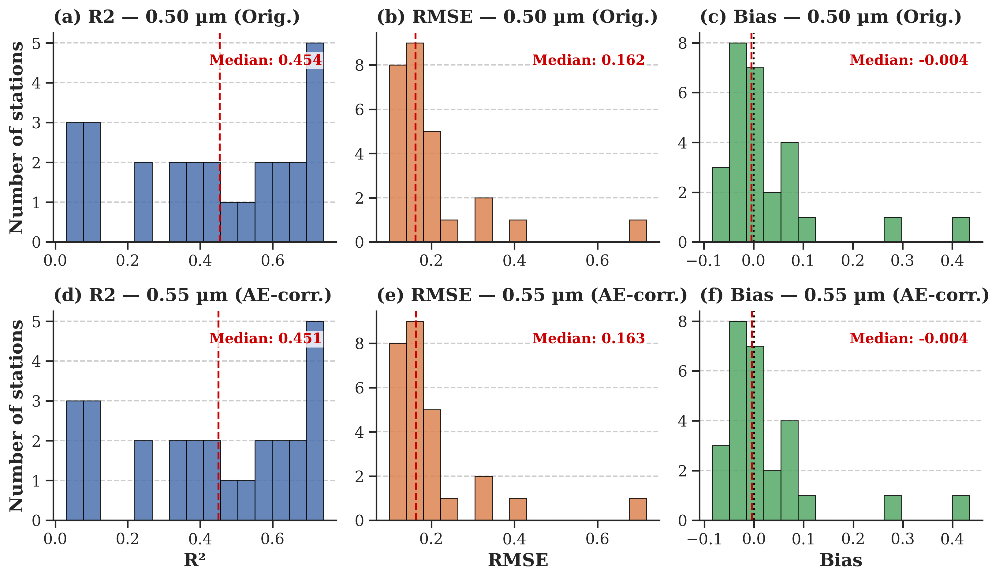

In [9]:
import string
# REDUCED FIGURE SIZE: 
# A smaller inch size forces the relative font sizes to be much larger and readable.
fig, axes = plt.subplots(2, 3, figsize=(11, 6.5))

# Letters for subplot labeling (a, b, c, d, e, f)
subplot_labels = string.ascii_lowercase
plot_idx = 0

# Concise labels to save space
hima_row_cfg = [
    (HIMA_050_COL, '0.50 µm (Orig.)'),
    (HIMA_055_COL, '0.55 µm (AE-corr.)'),
]

for row, (hima_col, hima_label) in enumerate(hima_row_cfg):
    # look up by second level of the MultiIndex
    variant_label = next(lbl for col, lbl, _ in HIMA_VARIANTS if col == hima_col)
    band_stats = stats_df.xs(variant_label, level='hima_variant')

    colors = ['#4C72B0', '#DD8452', '#55A868']
    for col_idx, (metric, color, xlabel) in enumerate([
        ('R2',   colors[0], 'R²'),
        ('RMSE', colors[1], 'RMSE'),
        ('Bias', colors[2], 'Bias'), # Simplified label
    ]):
        ax = axes[row, col_idx]
        data = band_stats[metric].dropna()
        
        ax.hist(data, bins=min(15, len(data)), color=color, edgecolor='black', linewidth=0.7, alpha=0.85)
        
        median_val = data.median()
        ax.axvline(median_val, color='#cc0000', lw=1.5, linestyle='--')
        
        if metric == 'Bias':
            ax.axvline(0, color='black', lw=1.5, linestyle=':')
            
        # SPACE SAVER: Replace legends with a clean text annotation in the corner
        ax.text(0.95, 0.90, f'Median: {median_val:.3f}', 
                transform=ax.transAxes, ha='right', va='top', 
                fontsize=11, fontweight='bold', color='#cc0000',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=1))
        
        # SPACE SAVER: X-labels ONLY on the bottom row
        if row == 1:
            ax.set_xlabel(xlabel, weight='bold')
        else:
            ax.set_xlabel('')
            
        # SPACE SAVER: Y-labels ONLY on the left-most column
        if col_idx == 0:
            ax.set_ylabel('Number of stations', weight='bold')
        else:
            ax.set_ylabel('')
        
        # Concise Titles
        title_str = f'({subplot_labels[plot_idx]}) {metric} — {hima_label}'
        ax.set_title(title_str, loc='left', fontweight='bold', pad=8)
        
        sns.despine(ax=ax)
        ax.yaxis.grid(True, linestyle='--', alpha=0.4, color='gray')
        
        plot_idx += 1

# SPACE SAVER: Removed suptitle completely. Put this text in your paper's caption instead!
plt.tight_layout()
plt.show()

## 8 · Seasonal / Monthly Correlation

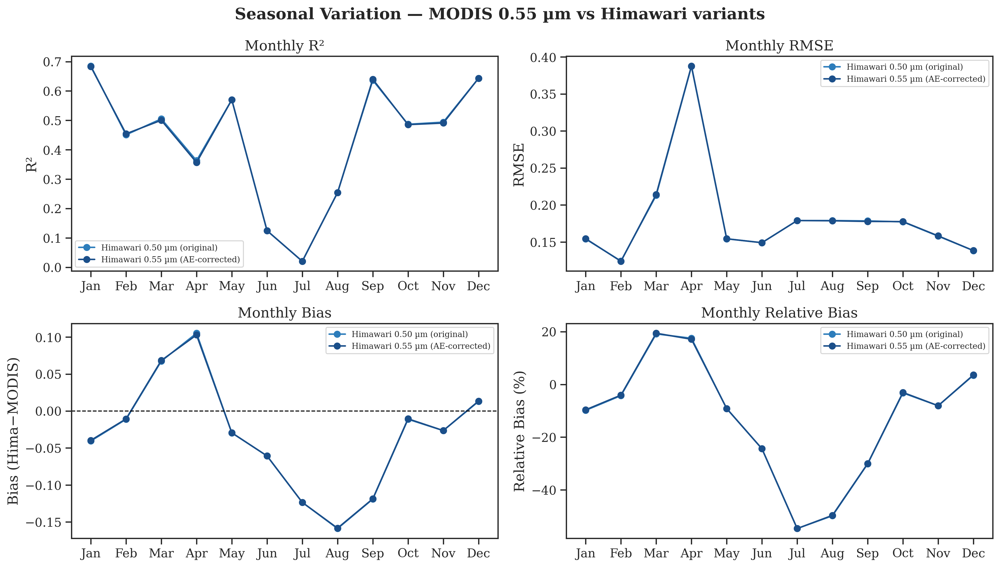

In [10]:
all_df['month'] = all_df['timestamp'].dt.month
all_df['year']  = all_df['timestamp'].dt.year

monthly_dfs = {}
for hima_col, hima_label, color in HIMA_VARIANTS:
    monthly_stats = []
    for m, grp in all_df.groupby('month'):
        if len(grp) < 10:
            continue
        s = regression_stats(grp[MODIS_COL], grp[hima_col])
        s['month'] = m
        monthly_stats.append(s)
    monthly_dfs[hima_col] = pd.DataFrame(monthly_stats).set_index('month')

month_names = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, axes = plt.subplots(2, 2, figsize=(14, 8))

for ax, col, ylabel, title in [
    (axes[0,0], 'R2',          'R²',                'Monthly R²'),
    (axes[0,1], 'RMSE',        'RMSE',              'Monthly RMSE'),
    (axes[1,0], 'Bias',        'Bias (Hima−MODIS)', 'Monthly Bias'),
    (axes[1,1], 'RelBias_pct', 'Relative Bias (%)', 'Monthly Relative Bias'),
]:
    for hima_col, hima_label, color in HIMA_VARIANTS:
        df_m = monthly_dfs[hima_col]
        ax.plot(df_m.index, df_m[col], marker='o', color=color, label=hima_label)
    ref_months = monthly_dfs[HIMA_050_COL].index
    ax.set_xticks(ref_months)
    ax.set_xticklabels([month_names[m-1] for m in ref_months])
    ax.set_title(title); ax.set_ylabel(ylabel)
    if col == 'Bias':
        ax.axhline(0, color='black', lw=1, linestyle='--')
    ax.legend(fontsize=8)

plt.suptitle('Seasonal Variation — MODIS 0.55 µm vs Himawari variants', fontweight='bold')
plt.tight_layout(); plt.show()

## 9 · Time-Series Comparison — Top-N Stations

In [11]:
TOP_N = 13

n_by_station = all_df.groupby('station_id').size().sort_values(ascending=False)
top_stations = n_by_station.head(TOP_N).index.tolist()

fig, axes = plt.subplots(TOP_N, 1, figsize=(16, 3.8 * TOP_N), sharex=False)
if TOP_N == 1:
    axes = [axes]

for ax, sid in zip(axes, top_stations):
    df   = station_dfs[sid]
    name = df['Name'].iloc[0] if 'Name' in df.columns else sid

    ax.plot(df.index, df[MODIS_COL],    's-',  color='#C4782A', ms=4, lw=1.3,
            label='MODIS 0.55 µm', alpha=0.9)
    ax.plot(df.index, df[HIMA_050_COL], 'o-',  color='#2D7DBB', ms=4, lw=1.5,
            label='Himawari 0.50 µm (original)', alpha=0.9)
    ax.plot(df.index, df[HIMA_055_COL], '^--', color='#1B4F8A', ms=4, lw=1.5,
            label='Himawari 0.55 µm (AE-corrected)', alpha=0.9)

    # shade gap between MODIS 0.55 and Himawari 0.50 to show bias
    ax.fill_between(df.index, df[MODIS_COL], df[HIMA_050_COL],
                    alpha=0.07, color='gray')

    def _r2(sid, hima_label):
        key = (sid, hima_label)
        return f"{stats_df.loc[key, 'R2']:.3f}" if key in stats_df.index else 'N/A'

    lbl_050 = next(lbl for col, lbl, _ in HIMA_VARIANTS if col == HIMA_050_COL)
    lbl_055 = next(lbl for col, lbl, _ in HIMA_VARIANTS if col == HIMA_055_COL)
    n = df[[MODIS_COL, HIMA_050_COL]].dropna().shape[0]

    ax.set_title(
        f"{str(name)[:65]}\n"
        f"R²(vs 0.50)={_r2(sid, lbl_050)}  |"
        f"  R²(vs 0.55 AE)={_r2(sid, lbl_055)}  |  n={n} co-located days",
        fontsize=9
    )
    ax.set_ylabel('AOD')
    ax.legend(fontsize=8, loc='upper right', ncol=3)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha='right')
    ax.set_ylim(bottom=0)

plt.suptitle(
    f'AOD Time-Series — Top {TOP_N} Stations by Data Count\n'
    'Brown = MODIS 0.55 µm  |  Blue = Himawari 0.50 µm  |  Dark Blue = Himawari 0.55 µm (AE-corrected)',
    fontweight='bold', fontsize=12, y=1.01
)
plt.tight_layout()
plt.show()

## 10 · Interactive Station Selector

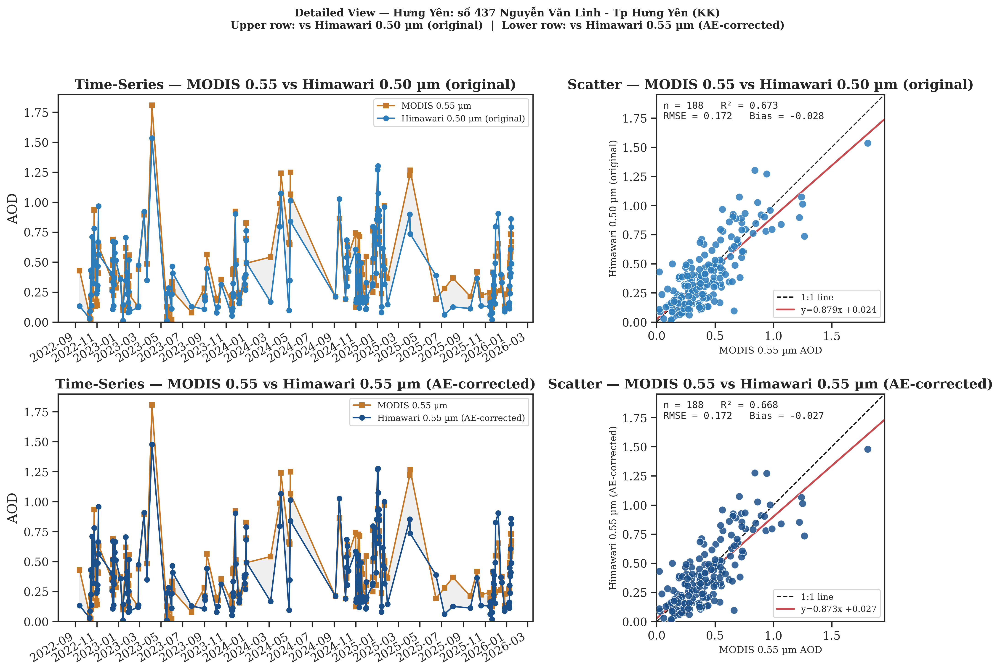

In [12]:
STATION_ID = top_stations[3]   # ← replace with any station ID string

df   = station_dfs[STATION_ID]
name = df['Name'].iloc[0] if 'Name' in df.columns else STATION_ID

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for row, (hima_col, hima_label, color) in enumerate(HIMA_VARIANTS):
    s = regression_stats(df[MODIS_COL], df[hima_col])

    # ── Time-series ─────────────────────────────────────────────────────────
    ax = axes[row, 0]
    ax.plot(df.index, df[MODIS_COL], 's-', color='#C4782A', ms=5, lw=1.5,
            label='MODIS 0.55 µm')
    ax.plot(df.index, df[hima_col],  'o-', color=color,     ms=5, lw=1.5,
            label=hima_label)
    ax.fill_between(df.index, df[MODIS_COL], df[hima_col],
                    alpha=0.12, color='gray')
    ax.set_title(f'Time-Series — MODIS 0.55 vs {hima_label}', fontweight='bold')
    ax.set_ylabel('AOD')
    ax.legend(fontsize=9)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha='right')
    ax.set_ylim(bottom=0)

    # ── Scatter ─────────────────────────────────────────────────────────────
    ax2 = axes[row, 1]
    valid = df[[MODIS_COL, hima_col]].dropna()
    ax2.scatter(valid[MODIS_COL], valid[hima_col],
                c=color, edgecolors='white', linewidths=0.5, s=60, alpha=0.85, zorder=3)
    lim_max = max(valid[MODIS_COL].max(), valid[hima_col].max()) * 1.08
    lims    = [0, lim_max]
    xfit    = np.linspace(*lims, 200)
    ax2.plot(lims, lims, 'k--', lw=1.2, label='1:1 line')
    ax2.plot(xfit, s['slope']*xfit + s['intercept'], 'r-', lw=2,
             label=f"y={s['slope']:.3f}x {s['intercept']:+.3f}")
    ax2.set_xlim(lims); ax2.set_ylim(lims)
    ax2.set_aspect('equal', adjustable='box')
    ax2.set_xlabel('MODIS 0.55 µm AOD', fontsize=10)
    ax2.set_ylabel(hima_label, fontsize=10)
    ax2.set_title(f'Scatter — MODIS 0.55 vs {hima_label}', fontweight='bold')
    stats_text = (f"n = {s['n']}   R² = {s['R2']:.3f}\n"
                  f"RMSE = {s['RMSE']:.3f}   Bias = {s['Bias']:+.3f}")
    ax2.text(0.03, 0.97, stats_text, transform=ax2.transAxes,
             va='top', fontsize=10, fontfamily='monospace',
             bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.9))
    ax2.legend(fontsize=9, loc='lower right')

plt.suptitle(
    f'Detailed View — {str(name)[:70]}\n'
    'Upper row: vs Himawari 0.50 µm (original)  |  '
    'Lower row: vs Himawari 0.55 µm (AE-corrected)',
    fontweight='bold', fontsize=11
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## 11 · Global Time-Series (Monthly Mean, All Stations)

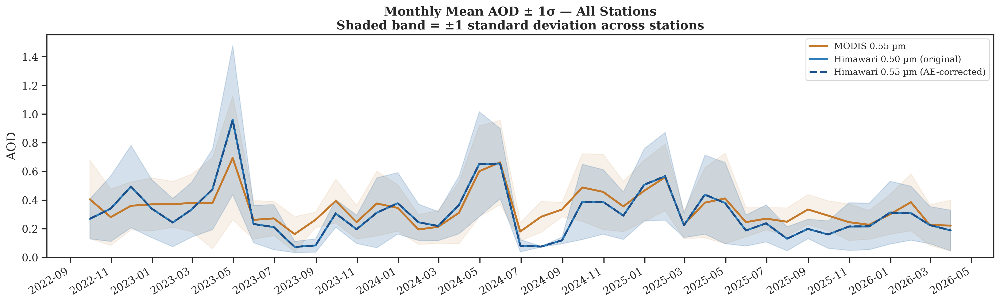

In [13]:
cols_to_plot = [MODIS_COL, HIMA_050_COL, HIMA_055_COL]

monthly_mean = (
    all_df.set_index('timestamp')[cols_to_plot]
    .resample('1ME')
    .agg(['mean', 'std'])
)
monthly_mean.columns = ['_'.join(c) for c in monthly_mean.columns]

fig, ax = plt.subplots(figsize=(16, 5))

plot_cfg = [
    (MODIS_COL,    '#C4782A', 'MODIS 0.55 µm',                  '-'),
    (HIMA_050_COL, '#2D7DBB', 'Himawari 0.50 µm (original)',     '-'),
    (HIMA_055_COL, '#1B4F8A', 'Himawari 0.55 µm (AE-corrected)', '--'),
]

for col, color, label, ls in plot_cfg:
    mu  = monthly_mean[f'{col}_mean']
    sig = monthly_mean[f'{col}_std']
    ax.plot(mu.index, mu, color=color, lw=2.2, linestyle=ls, label=label, zorder=3)
    ax.fill_between(mu.index, (mu - sig).clip(lower=0), mu + sig,
                    color=color, alpha=0.10)

ax.set_title(
    'Monthly Mean AOD ± 1σ — All Stations\n'
    'Shaded band = ±1 standard deviation across stations',
    fontweight='bold'
)
ax.set_ylabel('AOD')
ax.legend(fontsize=10)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha='right')
ax.set_ylim(bottom=0)
plt.tight_layout()
plt.show()

## 12 · Heatmap — R² by Station × Month

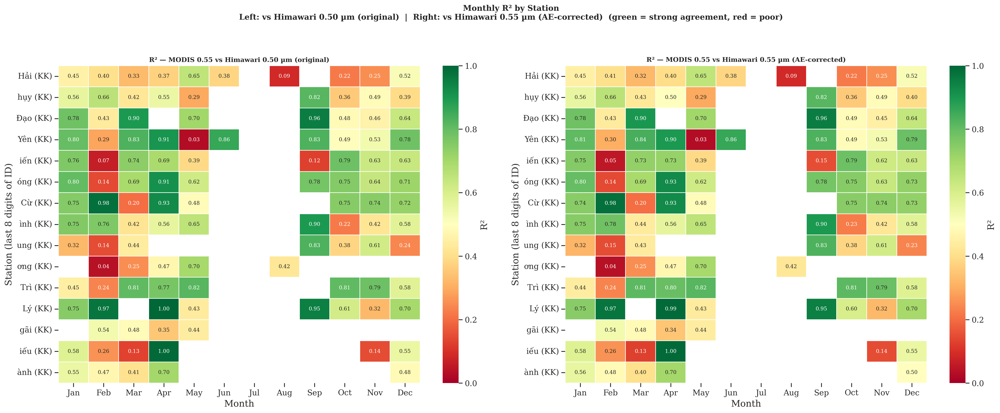

In [14]:
MIN_MONTHLY_N = 3

station_n      = stats_df.groupby(level='station_id')['n'].max()
HEATMAP_STATIONS = station_n[station_n >= 10].sort_values(ascending=False).head(15).index.tolist()

fig, axes = plt.subplots(1, 2, figsize=(22, max(4, len(HEATMAP_STATIONS) * 0.6)))

for ax, (hima_col, hima_label, _) in zip(axes, HIMA_VARIANTS):
    pivot_r2 = pd.DataFrame(index=HEATMAP_STATIONS, columns=range(1, 13), dtype=float)

    for sid in HEATMAP_STATIONS:
        df_s = station_dfs[sid].copy()
        df_s['month'] = df_s.index.month
        for m, grp in df_s.groupby('month'):
            valid = grp[[MODIS_COL, hima_col]].dropna()
            if len(valid) >= MIN_MONTHLY_N:
                r, _ = stats.pearsonr(valid[MODIS_COL], valid[hima_col])
                pivot_r2.loc[sid, m] = round(r**2, 3)

    pivot_r2.columns = [month_names[m-1] for m in pivot_r2.columns]
    pivot_r2.index   = [str(s)[-8:] for s in pivot_r2.index]

    sns.heatmap(
        pivot_r2.astype(float), annot=True, fmt='.2f',
        cmap='RdYlGn', vmin=0, vmax=1,
        linewidths=0.5, ax=ax, cbar_kws={'label': 'R²'},
        annot_kws={'size': 8}
    )
    ax.set_title(f'R² — MODIS 0.55 vs {hima_label}', fontweight='bold', fontsize=10)
    ax.set_xlabel('Month')
    ax.set_ylabel('Station (last 8 digits of ID)')

plt.suptitle(
    'Monthly R² by Station\n'
    'Left: vs Himawari 0.50 µm (original)  |  '
    'Right: vs Himawari 0.55 µm (AE-corrected)  '
    '(green = strong agreement, red = poor)',
    fontweight='bold', fontsize=12
)
plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

## 13 · Summary Table — Export

In [15]:
export_path = 'AOD_station_correlation_summary.csv'
stats_df.sort_values(['hima_variant', 'R2'], ascending=[True, False]).to_csv(export_path)
print(f'Saved → {export_path}')

# Per-variant global stats
gs_050 = regression_stats(all_df[MODIS_COL], all_df[HIMA_050_COL])
gs_055 = regression_stats(all_df[MODIS_COL], all_df[HIMA_055_COL])

lbl_050 = next(lbl for col, lbl, _ in HIMA_VARIANTS if col == HIMA_050_COL)
lbl_055 = next(lbl for col, lbl, _ in HIMA_VARIANTS if col == HIMA_055_COL)
s050 = stats_df.xs(lbl_050, level='hima_variant')
s055 = stats_df.xs(lbl_055, level='hima_variant')

summary = {
    'Metric': [
        'N co-located records',
        'N stations',
        'Records with AE correction applied',
        'Records using fallback (AE = NaN)',
        'Median R²  — vs Himawari 0.50 µm',
        'Median R²  — vs Himawari 0.55 µm (AE)',
        'Median RMSE — vs Himawari 0.50 µm',
        'Median RMSE — vs Himawari 0.55 µm (AE)',
        'Global Bias — vs Himawari 0.50 µm  (Hima−MODIS)',
        'Global Bias — vs Himawari 0.55 µm  (Hima−MODIS)',
        'Stations R²≥0.7 — vs Himawari 0.50 µm',
        'Stations R²≥0.7 — vs Himawari 0.55 µm (AE)',
    ],
    'Value': [
        f"{len(all_df):,}",
        f"{all_df['station_id'].nunique()}",
        f"{all_df['AE_Himawari'].notna().sum():,}  "
        f"({100*all_df['AE_Himawari'].notna().mean():.1f}%)",
        f"{all_df['AE_Himawari'].isna().sum():,}  "
        f"({100*all_df['AE_Himawari'].isna().mean():.1f}%)",
        f"{s050['R2'].median():.3f}",
        f"{s055['R2'].median():.3f}",
        f"{s050['RMSE'].median():.3f}",
        f"{s055['RMSE'].median():.3f}",
        f"{gs_050['Bias']:+.3f}  ({gs_050['RelBias_pct']:+.1f}%)",
        f"{gs_055['Bias']:+.3f}  ({gs_055['RelBias_pct']:+.1f}%)",
        f"{(s050['R2'] >= 0.7).sum()} / {len(s050)}",
        f"{(s055['R2'] >= 0.7).sum()} / {len(s055)}",
    ]
}
display(pd.DataFrame(summary).set_index('Metric'))

Saved → AOD_station_correlation_summary.csv


,Value
Metric,
N co-located records,"3,047"
N stations,27
Records with AE correction applied,448 (14.7%)
Records using fallback (AE = NaN),"2,599 (85.3%)"
Median R² — vs Himawari 0.50 µm,0.454
Median R² — vs Himawari 0.55 µm (AE),0.451
Median RMSE — vs Himawari 0.50 µm,0.162
Median RMSE — vs Himawari 0.55 µm (AE),0.163
Global Bias — vs Himawari 0.50 µm (Hima−MODIS),+0.003 (+0.8%)
